In [1]:
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd 
import random
import torch
import torchvision
from torchvision import transforms
from torch.utils.data import DataLoader, random_split, Dataset
from torch import nn
import torch.nn.functional as F
import torch.optim as optim
import cv2 as cv
from PIL import Image
from torchvision.datasets import ImageFolder
from matplotlib import patches

In [2]:
def load_image(filename) :
    img = Image.open(filename)
    img.load()
    data = np.asarray(img, dtype="float") / 256
    return data

In [3]:
# from google.colab import drive
# drive.mount('/content/drive')

In [4]:
DATA_PATH = Path("data/obm_channels_ds")
TEST_PATH = Path("data/obm_channels_test")

meander_paths = ['wavy',
                 'amp_hi40_amp_lo3_angdev15_num_channels2_seg_hi30_seg_lo10',
                 'amp_hi40_amp_lo3_angdev15_num_channels1_seg_hi30_seg_lo10']

In [5]:
all_images = list(DATA_PATH.glob(pattern="*/*.jpg"))
images = []

for im in all_images:
    flag = 0
    for m_p in meander_paths:
        if m_p in str(im):
            flag = 1
    if flag != 1:
        images.append(im)

del all_images

for im in images:
    for m_p in meander_paths:
        if m_p in str(im):
            print(im)

In [6]:
print(len(images), "images in train")
print(len(list(TEST_PATH.glob(pattern="*"))), "images in test")

3256 images in train
1609 images in test


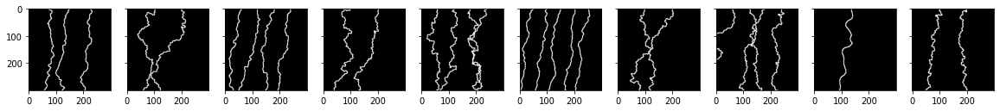

In [7]:
fig, axes = plt.subplots(ncols=10, figsize=(20, 2), sharey=True)

idxs = np.random.choice(np.arange(len(images)), 10)

for i, idx in enumerate(idxs):
    img = cv.imread(str(images[idx]), 0)
    axes[i].imshow(img, cmap="gray")

In [8]:
# Check if the GPU is available
#device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
device = torch.device("cpu")
print(f'Selected device: {device}')

batch_size = 128

Selected device: cpu


In [9]:
class ImagesDataset(Dataset):
    def __init__(self, main_dir, transform, device, mask_transform=None, pattern="*.jpg"):
        self.main_dir = Path(main_dir)
        self.transform = transform
        self.mask_transform = mask_transform
        self.device = device
        
        self.img_paths = list(main_dir.glob(pattern))

    def __len__(self):
        return len(self.img_paths)

    def __getitem__(self, idx):
        img_path = self.img_paths[idx]

        image = cv.imread(str(img_path), 0)
        transformed_image = self.transform(image).to(self.device)

        if self.mask_transform is not None:
            masked_image = self.mask_transform(transformed_image)
        else:
            masked_image = transformed_image

        return transformed_image, masked_image

In [10]:
IMAGE_SIZE = 288

train_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.RandomRotation(180),
    transforms.RandomCrop((150, 150)),
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.RandomHorizontalFlip(0.5), 
    transforms.RandomVerticalFlip(0.5),
])

erasing_transform = transforms.Compose([
    transforms.RandomErasing(p=0.3, scale=(0.02, 0.33), ratio=(0.3, 1), value=0),
    transforms.RandomErasing(p=0.3, scale=(0.1, 0.6), ratio=(0.3, 1), value=0)
])

test_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
])

train_dataset = ImagesDataset(DATA_PATH, transform=train_transform, device=device, mask_transform=erasing_transform, pattern="*/*.jpg")
test_dataset = ImagesDataset(TEST_PATH, transform=test_transform, device=device)

m = len(train_dataset)

train_data, val_data = random_split(train_dataset, [m - int(m*0.2), int(m*0.2)])

train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size)
valid_loader = torch.utils.data.DataLoader(val_data, batch_size=batch_size)

In [11]:
class Encoder(nn.Module):
    
    def __init__(self, latent_dim_size):
        super().__init__()
        
        ### Convolutional section
        self.encoder_cnn = nn.Sequential(
            nn.Conv2d(in_channels=1, out_channels=64, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.Mish(True),
            
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.Mish(True),
            nn.Dropout(p=0.5),
            
            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.Mish(True),
            nn.Dropout(p=0.5),
            
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.Mish(True),
            nn.Dropout(p=0.5),
            
            nn.Conv2d(in_channels=256, out_channels=300, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(300),
            nn.Mish(True),
            nn.Dropout(p=0.5),

            nn.Conv2d(in_channels=300, out_channels=300, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(300),
            nn.Mish(True),
            nn.Dropout(p=0.5),
            
            nn.Conv2d(in_channels=300, out_channels=300, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(300),
            nn.Mish(True),
            nn.Dropout(p=0.5),
            
            nn.Conv2d(in_channels=300, out_channels=300, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(300),
            nn.Mish(True),
            nn.Dropout(p=0.5),

            nn.Conv2d(in_channels=300, out_channels=500, kernel_size=3, stride=2, padding=0),
            nn.BatchNorm2d(500),
            nn.Mish(True),
        )
        
        ### Flatten layer
        self.flatten = nn.Flatten(start_dim=1)
        
        ### Linear section
        self.encoder_lin = nn.Sequential(
            nn.Linear(4 * 4 * 500, latent_dim_size),
            nn.Mish(True),
        )
        
    def forward(self, x):
        x = self.encoder_cnn(x)
        x = self.flatten(x)
        x = self.encoder_lin(x)
        return x


class Decoder(nn.Module):
    
    def __init__(self, latent_dim_size):
        super().__init__()
        self.decoder_lin = nn.Sequential(
            nn.Linear(latent_dim_size, 4 * 4 * 500),
            nn.Mish(True),
        )

        self.unflatten = nn.Unflatten(dim=1, unflattened_size=(500, 4, 4))

        self.decoder_conv = nn.Sequential(
            nn.ConvTranspose2d(in_channels=500, out_channels=300, kernel_size=3, stride=2, output_padding=0),
            nn.BatchNorm2d(300),
            nn.Mish(True),
            
            nn.Conv2d(in_channels=300, out_channels=300, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(300),
            nn.Mish(True),
            nn.Dropout(p=0.5),

            nn.ConvTranspose2d(in_channels=300, out_channels=300, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(300),
            nn.Mish(True),
            nn.Dropout(p=0.5),
            
            nn.ConvTranspose2d(in_channels=300, out_channels=300, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(300),
            nn.Mish(True),
            nn.Dropout(p=0.5),
            
            nn.Conv2d(in_channels=300, out_channels=256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.Mish(True),
            nn.Dropout(p=0.5),

            nn.ConvTranspose2d(in_channels=256, out_channels=128, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(128),
            nn.Mish(True),
            nn.Dropout(p=0.5),
            
            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.Mish(True),
            nn.Dropout(p=0.5),
            
            nn.ConvTranspose2d(in_channels=128, out_channels=64, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(64),
            nn.Mish(True),
            nn.Dropout(p=0.5),

            nn.ConvTranspose2d(in_channels=64, out_channels=1, kernel_size=3, stride=2, padding=1, output_padding=1)
        )
        
    def forward(self, x):
        x = self.decoder_lin(x)
        x = self.unflatten(x)
        x = self.decoder_conv(x)
        x = torch.sigmoid(x)
        return x

In [12]:
loss_fn = torch.nn.MSELoss()

### Define an optimizer (both for the encoder and the decoder!)
lr = 0.001

### Set the random seed for reproducible results
torch.manual_seed(0)

### Initialize the two networks
latent_dim_size = 1024

#model = Autoencoder(encoded_space_dim=encoded_space_dim)
encoder = Encoder(latent_dim_size=latent_dim_size)
decoder = Decoder(latent_dim_size=latent_dim_size)

params_to_optimize = [
    {'params': encoder.parameters()},
    {'params': decoder.parameters()}
]

optim = torch.optim.Adam(params_to_optimize, lr=lr)

# Move both the encoder and the decoder to the selected device
encoder.to(device)

Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): Mish(inplace=True)
    (3): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): Mish(inplace=True)
    (6): Dropout(p=0.5, inplace=False)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): Mish(inplace=True)
    (10): Dropout(p=0.5, inplace=False)
    (11): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (12): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (13): Mish(inplace=True)
    (14): Dropout(p=0.5, inplace=False)
    (15): Conv2d(256, 300, kernel_size=(3, 3), stride=(1, 1), pad

In [13]:
decoder.to(device)

Decoder(
  (decoder_lin): Sequential(
    (0): Linear(in_features=1024, out_features=8000, bias=True)
    (1): Mish(inplace=True)
  )
  (unflatten): Unflatten(dim=1, unflattened_size=(500, 4, 4))
  (decoder_conv): Sequential(
    (0): ConvTranspose2d(500, 300, kernel_size=(3, 3), stride=(2, 2))
    (1): BatchNorm2d(300, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): Mish(inplace=True)
    (3): Conv2d(300, 300, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(300, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): Mish(inplace=True)
    (6): Dropout(p=0.5, inplace=False)
    (7): ConvTranspose2d(300, 300, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
    (8): BatchNorm2d(300, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): Mish(inplace=True)
    (10): Dropout(p=0.5, inplace=False)
    (11): ConvTranspose2d(300, 300, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1)

In [14]:
def train_epoch(encoder, decoder, device, dataloader, loss_fn, optimizer):
    # Set train mode for both the encoder and the decoder
    encoder.train()
    decoder.train()
    train_loss = []
    
    for image_batch, masked_image_batch in dataloader:
        # Move tensor to the proper device
        image_batch = image_batch.to(device)
        
        encoded_data = encoder(masked_image_batch)

        decoded_data = decoder(encoded_data)
        
        loss = loss_fn(decoded_data, image_batch)
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        # print('\t partial train loss (single batch): %f' % (loss.data))
        train_loss.append(loss.detach().cpu().numpy())

    return np.mean(train_loss)


def test_epoch(encoder, decoder, device, dataloader, loss_fn):
    # Set evaluation mode for encoder and decoder
    encoder.eval()
    decoder.eval()
    with torch.no_grad(): # No need to track the gradients
        # Define the lists to store the outputs for each batch
        conc_out = []
        conc_label = []

        for image_batch, _ in dataloader:
            image_batch = image_batch.to(device)
            
            encoded_data = encoder(image_batch)
            decoded_data = decoder(encoded_data)
            
            conc_out.append(decoded_data.cpu())
            conc_label.append(image_batch.cpu())
        
        conc_out = torch.cat(conc_out)
        conc_label = torch.cat(conc_label) 
        
        val_loss = loss_fn(conc_out, conc_label)
    
    return val_loss.data


def plot_ae_outputs(encoder, decoder, n=10, randomize_indexes=False, title=""):
    fig, axes = plt.subplots(figsize=(16, 5), nrows=3, ncols=n, sharex=True, sharey=True)
    

    if randomize_indexes:
        idxs = np.random.choice(np.arange(len(test_dataset)), n)
    else:
        idxs = np.arange(n)
    
    for i, idx in enumerate(idxs):
        img, _ = test_dataset[i]
        img = img.unsqueeze(0).to(device) 
        masked_img = erasing_transform(img).to(device)

        encoder.eval()
        decoder.eval()
      
        with torch.no_grad():
            rec_img = decoder(encoder(masked_img))

        axes[0, i].imshow(img.cpu().squeeze().numpy(), cmap="gray")
        axes[1, i].imshow(masked_img.cpu().squeeze().numpy(), cmap="gray")
        axes[2, i].imshow(rec_img.cpu().squeeze().numpy(), cmap="gray")
      
        axes[0, i].get_xaxis().set_visible(False)
        axes[0, i].get_yaxis().set_visible(False) 
        axes[1, i].get_xaxis().set_visible(False)
        axes[1, i].get_yaxis().set_visible(False)
        axes[2, i].get_xaxis().set_visible(False)
        axes[2, i].get_yaxis().set_visible(False)
      
    fig.suptitle(f"Top: original, center: masked, bottom: reconstructed images{title}")
    return fig, axes

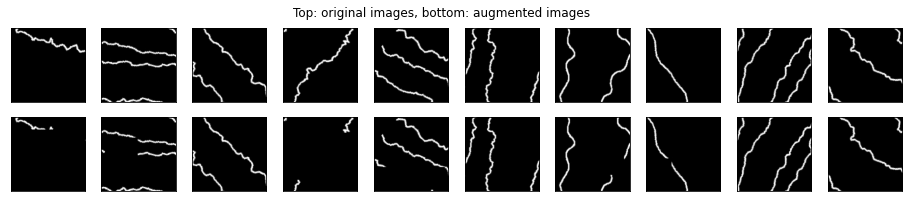

In [15]:
fig, axes = plt.subplots(figsize=(16, 3), nrows=2, ncols=10)

indexes = np.random.choice(np.arange(len(train_dataset)), 10)

for i, idx in enumerate(indexes):
    img, masked_img = train_dataset[idx]
    img = img.unsqueeze(0).to(device) 

    try:
        masked_img = erasing_transform(img)
    except IndexError:
        masked_img = img

    axes[0, i].imshow(img.cpu().squeeze().numpy(), cmap="gray")
    axes[1, i].imshow(masked_img.cpu().squeeze(), cmap="gray")
    
    axes[0, i].get_xaxis().set_visible(False)
    axes[0, i].get_yaxis().set_visible(False)  
    axes[1, i].get_xaxis().set_visible(False)
    axes[1, i].get_yaxis().set_visible(False)  
    
fig.suptitle("Top: original images, bottom: augmented images")
plt.show()

In [16]:
# Подгружаем предобученную модель ( в данном случае обучалась без меандр). При обучении с ноля не запускать 

ENCODER_PATH = Path("model/encoder")
DECODER_PATH = Path("model/decoder")

encoder.load_state_dict(torch.load(ENCODER_PATH, map_location=torch.device(device)))
decoder.load_state_dict(torch.load(DECODER_PATH, map_location=torch.device(device)))

<All keys matched successfully>

In [17]:
test_loss = test_epoch(encoder, decoder, device, valid_loader, loss_fn)

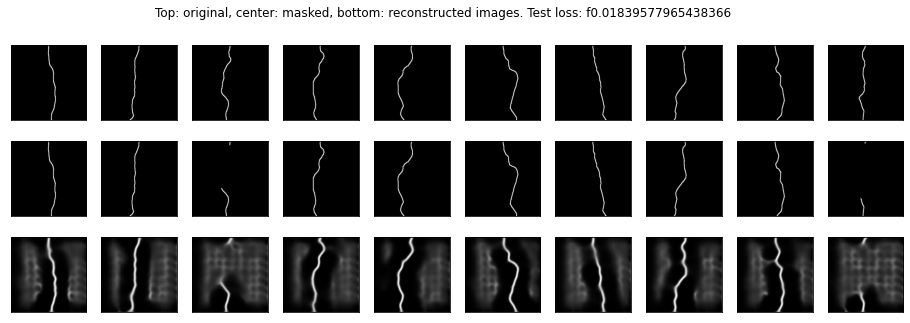

In [18]:
plot_ae_outputs(encoder, decoder, n=10, randomize_indexes=True, title=f". Test loss: f{test_loss}");

In [ ]:
# обучение модели (если переобучать не требуется, можно проигнорировать эту ячейку)
num_epochs = 101
diz_loss = {'train_loss': [], 'val_loss':[]}

for epoch in range(num_epochs):
    train_loss = train_epoch(encoder, decoder, device, train_loader, loss_fn, optim)
    val_loss = test_epoch(encoder, decoder, device, valid_loader, loss_fn)

    print(f"\n EPOCH {epoch + 1}\ttrain loss {train_loss}\tval loss {val_loss}")
    
    diz_loss['train_loss'].append(train_loss)
    diz_loss['val_loss'].append(val_loss)
    
    if epoch % 25 == 0:
        plot_ae_outputs(encoder, decoder, n=10)

In [ ]:
plt.figure(figsize=(10,8))
plt.semilogy(diz_loss['train_loss'], label='Train')
plt.semilogy(diz_loss['val_loss'], label='Valid')
plt.xlabel('Epoch')
plt.ylabel('Average Loss')
#plt.grid()
plt.legend()
#plt.title('loss')
plt.show()

Тестирование на реальной карте

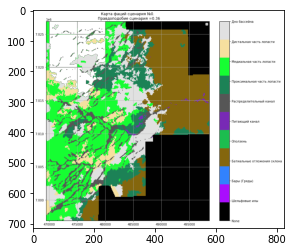

In [19]:
test_map = load_image(str(DATA_PATH / "../real_map.png"))

plt.imshow(test_map)

In [20]:
test_map.shape

(714, 824, 4)

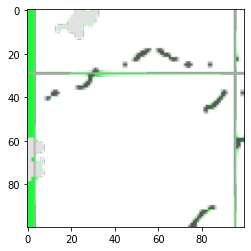

In [21]:
plt.imshow(test_map[50: 150, 50: 150])

In [22]:
new_test_map = test_map[50: 150, 50: 150, :3]

In [23]:
CHANNELS_COLOR = (86/256, 86/256, 86/256)

In [24]:
map_mask = (new_test_map == CHANNELS_COLOR).mean(axis=2)
map_mask = (map_mask > .9).astype(int)

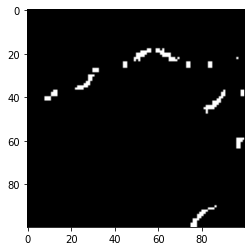

In [25]:
plt.imshow(map_mask * 255, cmap="gray")

In [26]:
resized_mask = transforms.Resize((IMAGE_SIZE, IMAGE_SIZE))(transforms.ToTensor()(map_mask)).to(device).float()

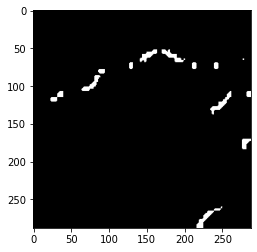

In [27]:
plt.imshow(resized_mask.squeeze(0).cpu().numpy() * 255, cmap="gray")

In [28]:
encoder.eval()
decoder.eval()

with torch.no_grad():
    rec_img = decoder(encoder(resized_mask.unsqueeze(1)))

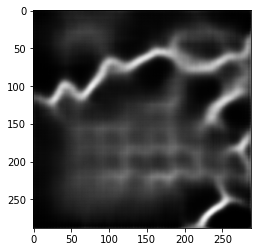

In [29]:
plt.imshow(rec_img.squeeze().squeeze().cpu().numpy() * 255, cmap="gray")

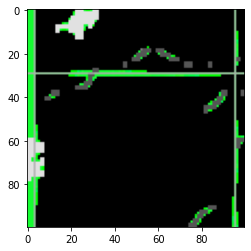

In [30]:
plt.imshow(new_test_map)

C:\Users\SalnikovMA\AppData\Local\Temp\ipykernel_15372\2551165239.py:58: RuntimeWarning: invalid value encountered in true_divide
  new_part = (old_part ** 2 + new_part ** 2) / (old_part + new_part)


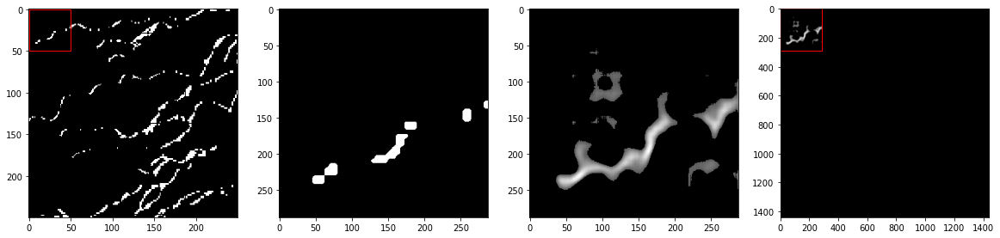

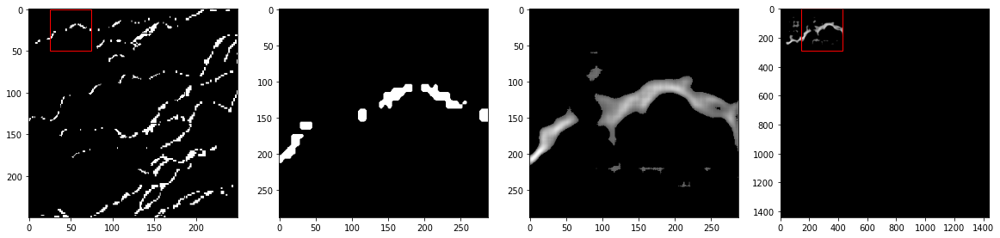

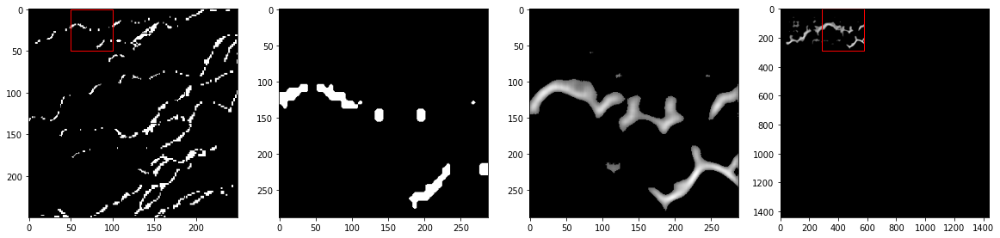

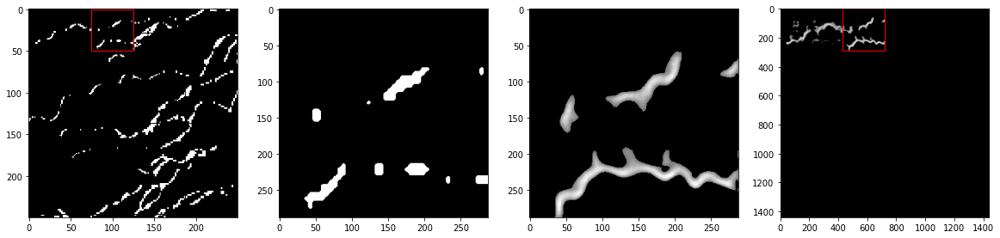

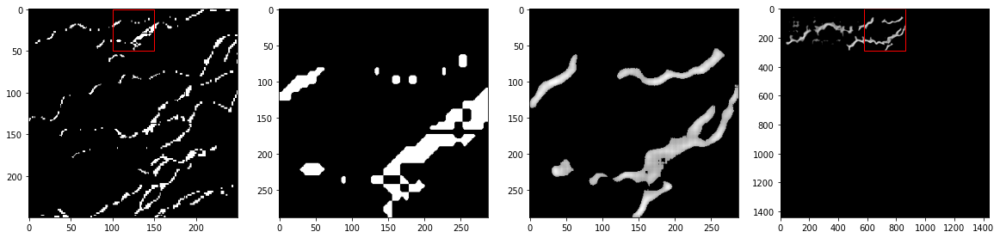

...

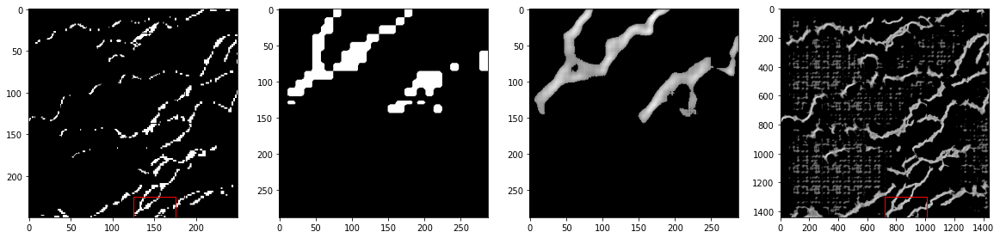

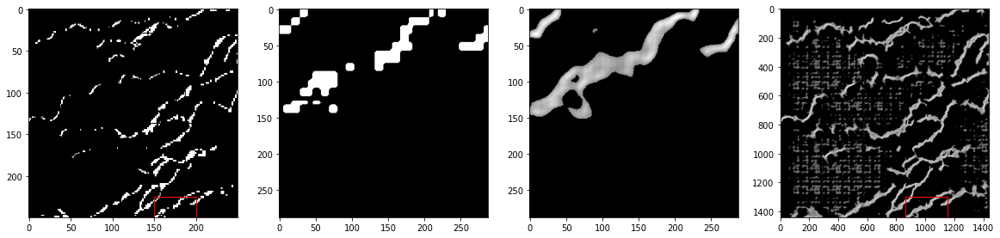

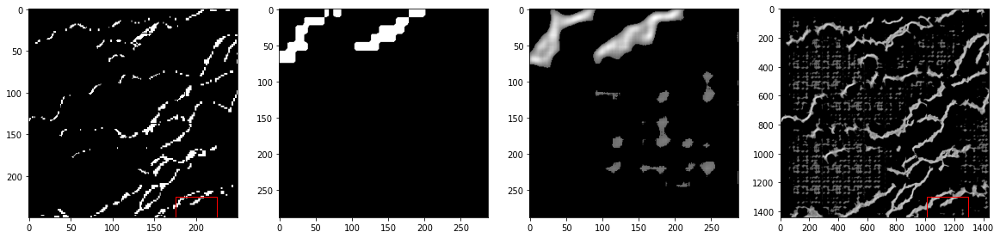

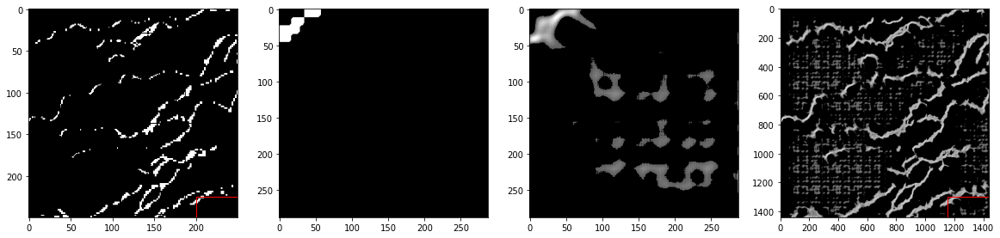

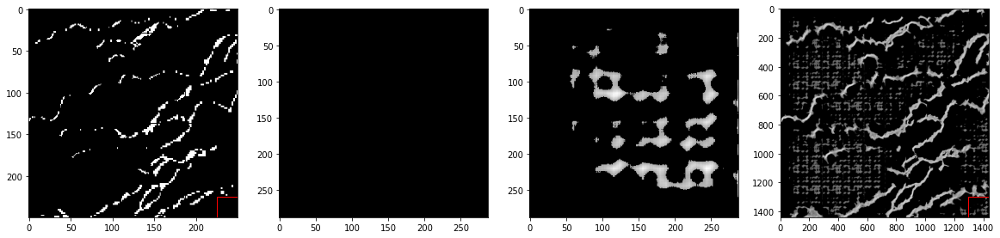

In [33]:
# первый этап восстановления плавающим окном 


step = 50
start = 50
stop = 300

length = stop - start
stride = step // 2
percentile_threshold = 90

CHANNELS_COLOR = (86/256, 86/256, 86/256)

n_iter = length // stride + 1

original_channels = test_map[start: stop, start: stop, :3]
original_map_mask = (original_channels == CHANNELS_COLOR).mean(axis=2)
original_map_mask = (original_map_mask > .9).astype(int)

original_map_mask = np.pad(original_map_mask, pad_width=((0, stride), (0, stride)), mode="constant", constant_values=0)


restored_map_size = n_iter * IMAGE_SIZE // 2
restored_map = np.zeros(shape=(restored_map_size, restored_map_size))

for i in range(n_iter - 1):
    for j in range(n_iter - 1):

        new_test_map = original_map_mask[i * stride: i * stride + step, j * stride: j * stride + step]
        resized_mask = transforms.Resize((IMAGE_SIZE, IMAGE_SIZE))(transforms.ToTensor()(new_test_map)).to(device).float()

        with torch.no_grad():
            rec_img = decoder(encoder(resized_mask.unsqueeze(1)))

        fig, axes = plt.subplots(ncols=4, figsize=(20, 5))

        axes[0].imshow(original_map_mask[:length, :length], cmap="gray")

        # draw red rectangle to show part of the original image taken
        rect = patches.Rectangle((j*stride, i*stride), step, step, linewidth=1, edgecolor="red", facecolor="none")
        axes[0].add_patch(rect)

        start_h = i * IMAGE_SIZE // 2
        start_v = j * IMAGE_SIZE // 2
        
        old_part = restored_map[start_h: start_h + IMAGE_SIZE, start_v: start_v + IMAGE_SIZE]
        new_part = rec_img.cpu().squeeze().numpy()

        pixels = new_part.flatten()
        threshold = np.percentile(pixels[pixels != 0], percentile_threshold)

        new_part[new_part <= threshold] = 0

        axes[1].imshow(resized_mask.squeeze().cpu(), cmap="gray")
        axes[2].imshow(new_part, cmap="gray")

        # new_part = np.array([new_part, old_part]).max(axis=0)
        new_part = (old_part ** 2 + new_part ** 2) / (old_part + new_part)
        new_part[np.isnan(new_part)] = 0

        restored_map[start_h: start_h + IMAGE_SIZE, start_v: start_v + IMAGE_SIZE] = new_part
        
        axes[3].imshow(restored_map[: - IMAGE_SIZE // 2, : - IMAGE_SIZE // 2], cmap="gray")
        rect = patches.Rectangle((start_v, start_h), IMAGE_SIZE, IMAGE_SIZE, linewidth=1, edgecolor="red", facecolor="none")
        axes[3].add_patch(rect)
        plt.show()
    #     break
    # break


Text(0.5, 0.98, 'Window size: 50, percentile threshold: 90, union strategy: max')

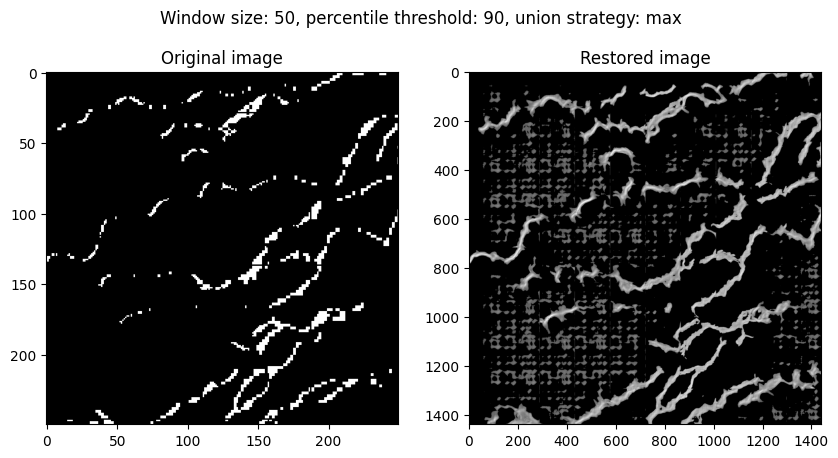

In [34]:
fig, axes = plt.subplots(dpi=100, ncols=2, figsize=(10, 5))
axes[0].imshow(original_map_mask[: -stride, : -stride], cmap="gray")
axes[0].set_title("Original image")

axes[1].imshow(restored_map[: - IMAGE_SIZE // 2, : - IMAGE_SIZE // 2], cmap="gray")
axes[1].set_title("Restored image")
fig.suptitle(f"Window size: {step}, percentile threshold: {percentile_threshold}, union strategy: max")

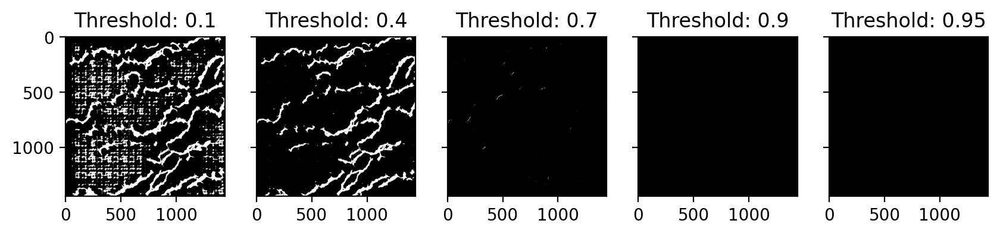

In [35]:
fig, axes = plt.subplots(ncols=5, figsize=(10, 20), dpi=200, sharey=True)

for i, threshold in enumerate([0.1, 0.4, 0.7, 0.9, 0.95]):
    axes[i].imshow(restored_map[:- IMAGE_SIZE // 2, :- IMAGE_SIZE // 2] > threshold, cmap="gray")
    axes[i].set_title(f"Threshold: {threshold}")

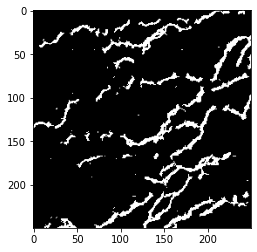

In [36]:
fist_step_restored_map = restored_map[:- IMAGE_SIZE // 2, :- IMAGE_SIZE // 2]
fist_step_restored_map[restored_map[:- IMAGE_SIZE // 2, :- IMAGE_SIZE // 2] >= 0.4] = 1
fist_step_restored_map[restored_map[:- IMAGE_SIZE // 2, :- IMAGE_SIZE // 2] < 0.4] = 0

fist_step_restored_map = cv.resize(fist_step_restored_map, (250, 250))

fist_step_restored_map[fist_step_restored_map >= 0.4] = 1
fist_step_restored_map[fist_step_restored_map < 0.4] = 0
plt.imshow(fist_step_restored_map, cmap="gray")

C:\Users\SalnikovMA\AppData\Local\Temp\ipykernel_15372\3269953235.py:57: RuntimeWarning: invalid value encountered in true_divide
  new_part = (old_part ** 2 + new_part ** 2) / (old_part + new_part)


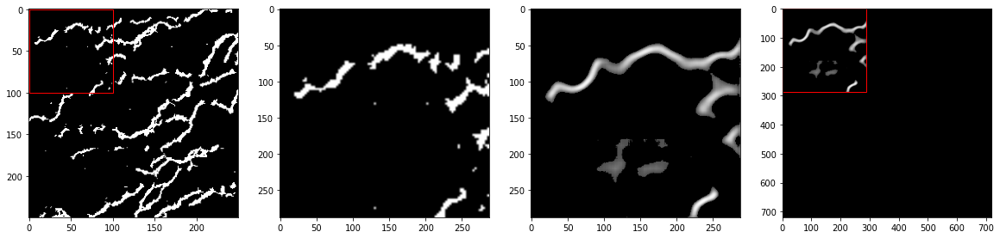

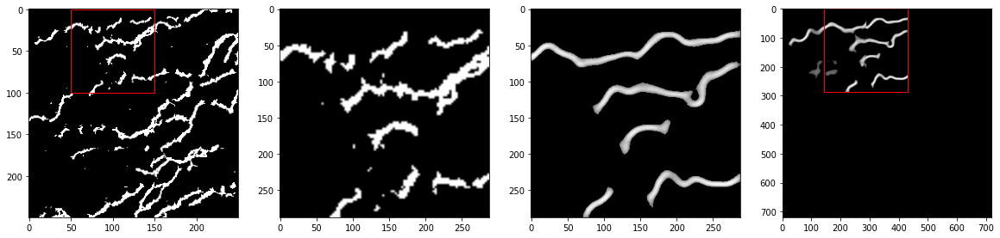

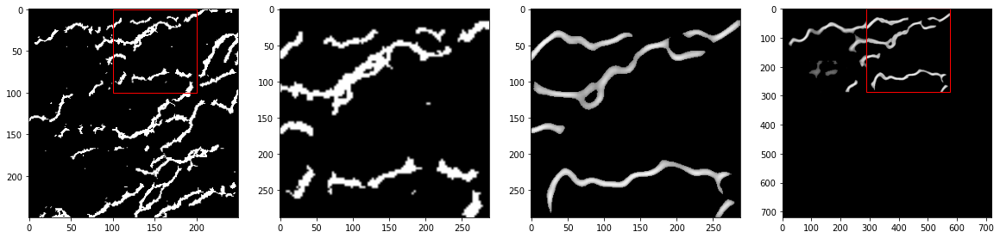

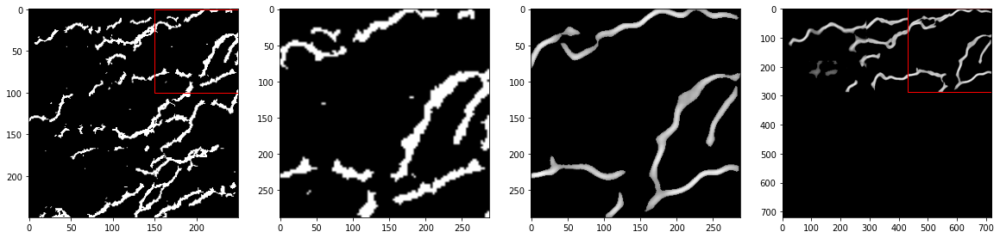

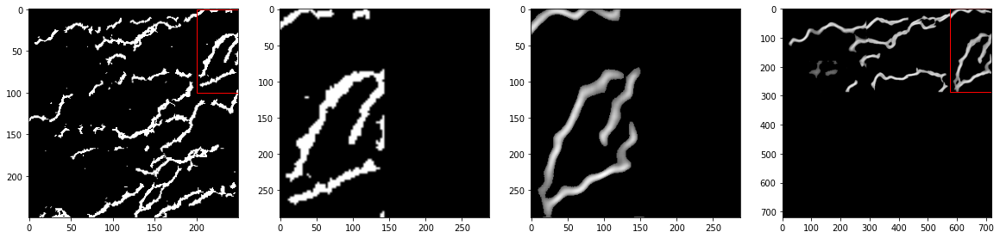

...

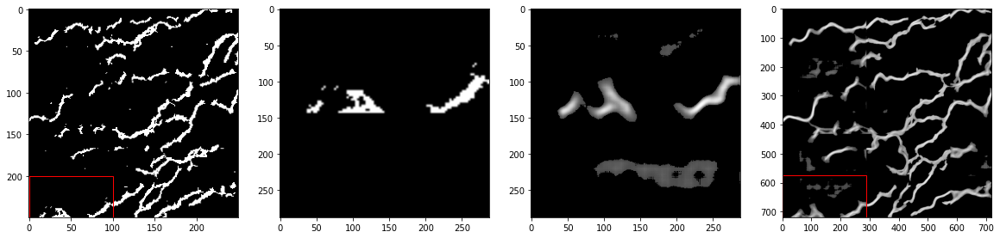

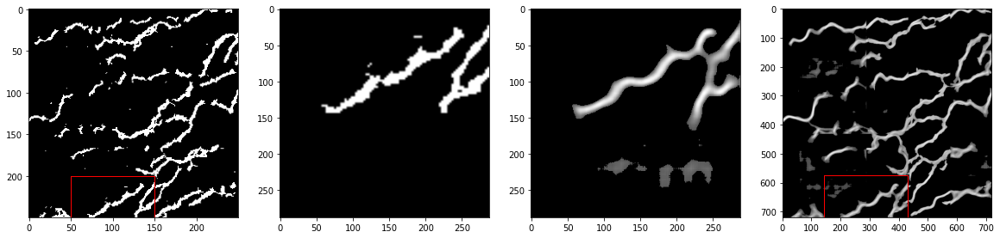

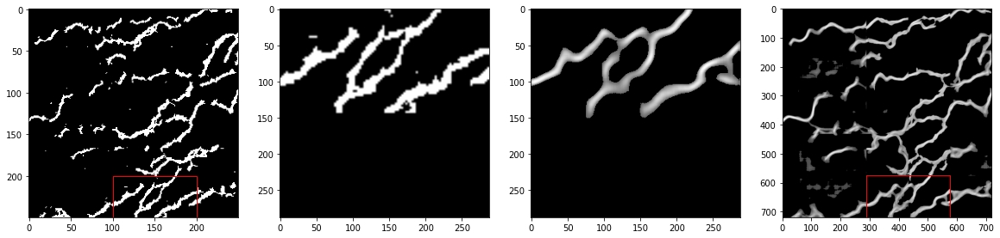

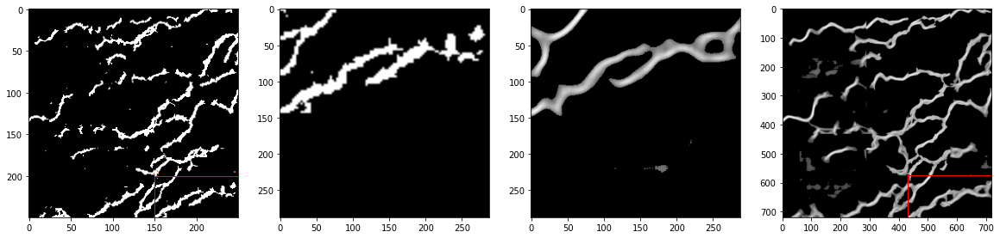

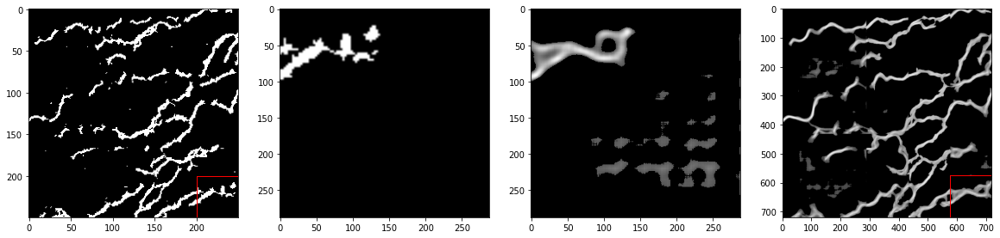

In [38]:
# второй этап восстановления плавающим окном большего размера


step = 100
start = 50
stop = 300

length = stop - start
stride = step // 2
percentile_threshold = 90

CHANNELS_COLOR = (86/256, 86/256, 86/256)

n_iter = length // stride + 1

#original_channels = test_map[start: stop, start: stop, :3]
original_map_mask = fist_step_restored_map
#original_map_mask = (original_map_mask > .9).astype(int)
original_map_mask = np.pad(original_map_mask, pad_width=((0, stride), (0, stride)), mode="constant", constant_values=0)


restored_map_size = n_iter * IMAGE_SIZE // 2
restored_map = np.zeros(shape=(restored_map_size, restored_map_size))

for i in range(n_iter - 1):
    for j in range(n_iter - 1):

        new_test_map = original_map_mask[i * stride: i * stride + step, j * stride: j * stride + step]
        resized_mask = transforms.Resize((IMAGE_SIZE, IMAGE_SIZE))(transforms.ToTensor()(new_test_map)).to(device).float()

        with torch.no_grad():
            rec_img = decoder(encoder(resized_mask.unsqueeze(1)))

        fig, axes = plt.subplots(ncols=4, figsize=(20, 5))

        axes[0].imshow(original_map_mask[:length, :length], cmap="gray")

        # draw red rectangle to show part of the original image taken
        rect = patches.Rectangle((j*stride, i*stride), step, step, linewidth=1, edgecolor="red", facecolor="none")
        axes[0].add_patch(rect)

        start_h = i * IMAGE_SIZE // 2
        start_v = j * IMAGE_SIZE // 2
        
        old_part = restored_map[start_h: start_h + IMAGE_SIZE, start_v: start_v + IMAGE_SIZE]
        new_part = rec_img.cpu().squeeze().numpy()

        pixels = new_part.flatten()
        threshold = np.percentile(pixels[pixels != 0], percentile_threshold)

        new_part[new_part <= threshold] = 0

        axes[1].imshow(resized_mask.squeeze().cpu(), cmap="gray")
        axes[2].imshow(new_part, cmap="gray")

        # new_part = np.array([new_part, old_part]).max(axis=0)
        new_part = (old_part ** 2 + new_part ** 2) / (old_part + new_part)
        new_part[np.isnan(new_part)] = 0

        restored_map[start_h: start_h + IMAGE_SIZE, start_v: start_v + IMAGE_SIZE] = new_part
        
        axes[3].imshow(restored_map[: - IMAGE_SIZE // 2, : - IMAGE_SIZE // 2], cmap="gray")
        rect = patches.Rectangle((start_v, start_h), IMAGE_SIZE, IMAGE_SIZE, linewidth=1, edgecolor="red", facecolor="none")
        axes[3].add_patch(rect)

        plt.show()




Text(0.5, 0.98, 'Window size: 100, percentile threshold: 90, union strategy: max')

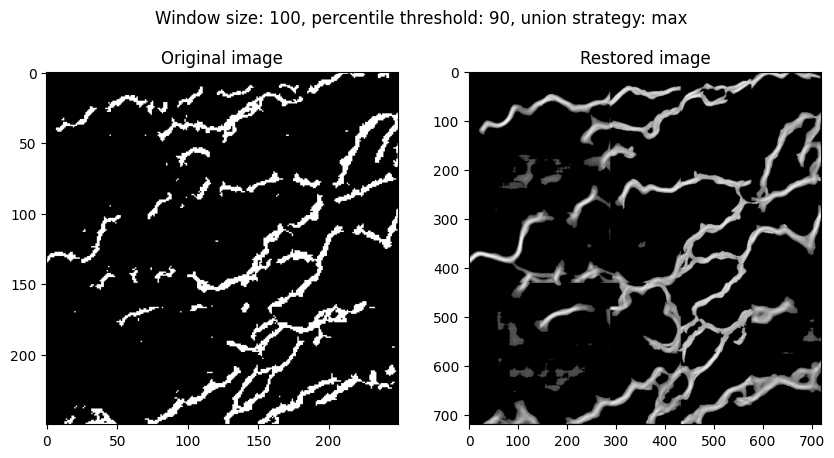

In [39]:
fig, axes = plt.subplots(dpi=100, ncols=2, figsize=(10, 5))
axes[0].imshow(original_map_mask[: -stride, : -stride], cmap="gray")
axes[0].set_title("Original image")

axes[1].imshow(restored_map[: - IMAGE_SIZE // 2, : - IMAGE_SIZE // 2], cmap="gray")
axes[1].set_title("Restored image")
fig.suptitle(f"Window size: {step}, percentile threshold: {percentile_threshold}, union strategy: max")

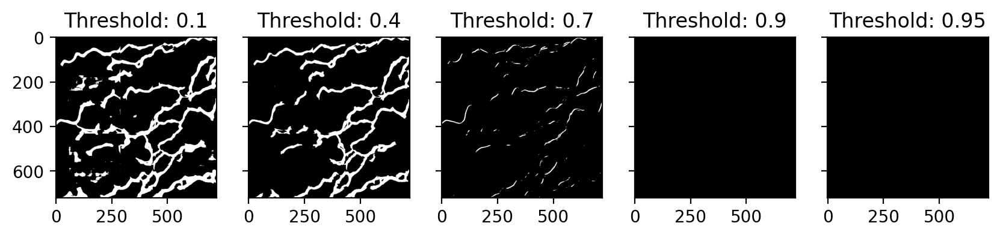

In [40]:
fig, axes = plt.subplots(ncols=5, figsize=(10, 20), dpi=200, sharey=True)

for i, threshold in enumerate([0.1, 0.4, 0.7, 0.9, 0.95]):
    axes[i].imshow(restored_map[:- IMAGE_SIZE // 2, :- IMAGE_SIZE // 2] > threshold, cmap="gray")
    axes[i].set_title(f"Threshold: {threshold}")

In [41]:
def test_image(img):
    resized_img = transforms.Resize((IMAGE_SIZE, IMAGE_SIZE))(transforms.ToTensor()(img)).to(device).float()

    with torch.no_grad():
        rec_img = decoder(encoder(resized_img.unsqueeze(1)))

    fig, axes = plt.subplots(ncols=2, figsize=(10, 5))

    axes[0].imshow(resized_img.squeeze().cpu(), cmap="gray")
    axes[1].imshow(rec_img.squeeze().cpu() > 0.5, cmap="gray")

    axes[0].set_title("Original image")
    axes[1].set_title("Restored image")

    plt.show()

In [ ]:
img = np.zeros((IMAGE_SIZE, IMAGE_SIZE))

test_image(img)

In [ ]:
# one dot
img[20: 30, 20: 30] = 1

test_image(img)

In [ ]:
# two dots

img[200: 220, 200: 230] = 1
test_image(img)

In [ ]:
# three dots

img[100: 120, 200: 230] = 1
test_image(img)